In [ ]:
!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.20 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.9/78.2 GB disk)


In [ ]:
from ultralytics import YOLO
import cv2

model = YOLO('yolov8n-pose.pt')

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import pandas as pd

def significant_pose_detection(arr, th):
  n = len(arr)
  i=0
  for itemm in arr:
    if np.sum(itemm[0]+itemm[1])!=0:
      i = i + 1

  sig_det = (i/n)
  if sig_det>=th:
    return 1

  return 0


# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose.png"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
  landmarks = []
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    landmarks.append([x,y])

  # Create a NumPy Array from list
  detections = significant_pose_detection(landmarks, th)
  if detections==1:
    det = det + 1
    for j in range(len(landmarks)):
      x = landmarks[j][0]
      y = landmarks[j][1]
      cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
      ttext = "("+str(x)+","+str(y)+")"
      cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,0,0), 1, cv2.LINE_AA)

    # Calling DataFrame constructor on list
    df = pd.DataFrame(landmarks, columns =['x'+str(det), 'y'+str(det)], dtype = float)
    concat_df = pd.concat([concat_df, df], axis=1)

    cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
    a = (landmarks[11][0] + landmarks[12][0])//2
    b = (landmarks[11][1] + landmarks[12][1])//2
    #print(a," ",b)
    #cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
    #cv2.circle(img, (a, b), 7, (0, 0, 255), 2)
    Q.append([a,b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
# Remove empty List from List
# using list comprehension
nQ = [ele for ele in m if ele != []]


dict={}
sorted_Q=sorted(Q)
for i,point in enumerate(Q):
  j=sorted_Q.index(point)
  dict[j]=i

# print(concat_df)

#k, _, _ = results.keypoints.xy.cpu().numpy().shape
k = len(nQ)  # actual detected person after discarding zeros

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(img, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
  i = i + 1

# dataframe to csv
concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns =['x', 'y'], dtype = int)
df_nQ.to_csv('nQ_centroids.csv')


print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)


image 1/1 /content/Q3_pose.png: 448x640 12 persons, 17.3ms
Speed: 11.0ms preprocess, 17.3ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)

 8 Persons detected.


In [ ]:
image_file_name = "output.jpg"
src = cv2.imread(image_file_name)
h,w,c = src.shape
print(h,w)
canva = np.zeros([h,w,3],dtype=np.uint8)  # change the h, w
print(nQ)

nQT = [[itemm[1],itemm[0]] for itemm in nQ]

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(canva, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(canva, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(canva, nQ[i], 7, (0, 0, 255), 2)
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"

  i = i + 1

canva = cv2.rotate(canva, cv2.ROTATE_90_CLOCKWISE)
## ---------------------------------------------------------------------
# Use Flip code 0 to flip vertically
image = cv2.flip(canva, 1)
i = 0
while i<k:
  ttext = "("+str(nQT[i][0])+","+str(nQT[i][1])+")"
  cv2.putText(image, ttext, (nQ[i][1]+15, nQ[i][0]), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,255), 1, cv2.LINE_AA)
  cv2.putText(image, "Person_"+str(i+1), (nQT[i][0]-55, nQT[i][1]), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,255,0), 1, cv2.LINE_AA)
  i = i + 1


cv2.imwrite("canvas.jpg", image)
cv2_imshow(image)

In [ ]:
numPeople=len(nQ)

In [ ]:
ev=[(nQ[-1][0]-nQ[0][0]),(nQ[-1][1]-nQ[0][1])]

In [ ]:
ev

[511, 52]

In [ ]:
forces=[]
for _ in range(numPeople):
  forces.append([0,0])

In [ ]:
k=100

In [ ]:
import math
def findMag(v):
  return math.sqrt(v[0]**2+v[1]**2)
def findAngle(p1,p2,ev):
  v12=[(p1[0]-p2[0]),(p1[1]-p2[1])]
  value=(v12[0]*ev[0]+v12[1]*ev[1])/(findMag(v12)*findMag(ev))
  return math.acos(value)
def findDis(p1,p2):
  return math.sqrt((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)

In [ ]:
for i in range(numPeople-1):
    theta=findAngle(nQ[i+1],nQ[i],ev)
    dis=findDis(nQ[i+1],nQ[i])
    deltaDis=dis*(1-math.cos(theta))
    forces[i][0]+=(k*deltaDis*math.cos(theta))
    if(nQ[i+1][1]>nQ[i][1]):
      forces[i][1]+=(k*deltaDis*math.sin(theta))
    else:
      forces[i][1]+=(-k*deltaDis*math.sin(theta))
    forces[i+1][0]+=(-1*forces[i][0])
    forces[i+1][1]+=(-1*forces[i][1])
    print(forces)

[[18.977191896809813, 1.583173767290764], [-18.977191896809813, -1.583173767290764], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-35.12137203684142, -5.1211343580313775], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [0.974959297692898, 1.7375206134068155], [0, 0], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [140.00768219652255, -28.99598035218141], [-140.00768219652255, 28.99598035218141], [0, 0], [0, 0], [0, 0]]
[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [140.00768219652255, -28.99598035218141], [65.52166363858981, -43.71229682567194], [-65.52166363858981, 43.71229682567194], [0, 0], [0, 0]]
[[

In [ ]:
# for i in range(numPeople-1):
#     theta=findAngle(nQ[i+1],nQ[i],ev)
#     dis=findDis(nQ[i+1],nQ[i])
#     deltaDis=dis*(1-math.cos(theta))
#     frcx=(k*deltaDis*math.cos(theta))
#     if(nQ[i+1][1]>nQ[i][1]):
#       frcy=(k*deltaDis*math.sin(theta))
#     else:
#       frcy=(-k*deltaDis*math.sin(theta))
#     forces[i][0]+=frcx
#     forces[i][1]+=frcy
#     forces[i+1][0]+=(-1*frcx)
#     forces[i+1][1]+=(-1*frcy)
#     print(forces)

In [ ]:
print(forces)

[[18.977191896809813, 1.583173767290764], [35.12137203684142, 5.1211343580313775], [-0.974959297692898, -1.7375206134068155], [140.00768219652255, -28.99598035218141], [65.52166363858981, -43.71229682567194], [428.2387255482644, 227.81282505064956], [-354.1232721068133, -235.3549064184685], [354.1232721068133, 235.3549064184685]]


In [ ]:
equivalent=[]
for force in forces:
  equivalent.append(math.sqrt(force[0]**2+force[1]**2))

In [ ]:
print(equivalent)

[19.043115592407187, 35.492770966257844, 1.9923663102380107, 142.97873251161008, 78.76454341735342, 485.0640053815162, 425.20021616043687, 425.20021616043687]


In [ ]:
import cv2
import numpy as np

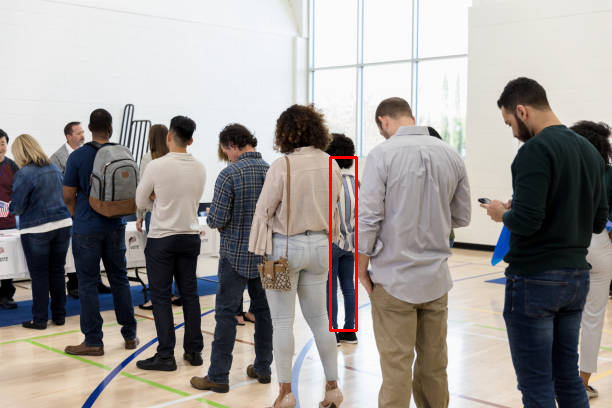

In [ ]:
def mark_outliers(nQ, tnet, threshold):
    img = cv2.imread('Q3_pose.png')

    nQ = np.array(nQ, dtype=int)

    for i in range(len(nQ)):
        if tnet[i] > threshold:
            person_no = dict[i] + 1

            x = concat_df['x' + str(person_no)]
            y = concat_df['y' + str(person_no)]

            x_non_zero = [value for value in x if value != 0]
            y_non_zero = [value for value in y if value != 0]

            min_x = int(min(x_non_zero)) if x_non_zero else 0
            min_y = int(min(y_non_zero)) if y_non_zero else 0
            max_x = int(max(x_non_zero)) if x_non_zero else 0
            max_y = int(max(y_non_zero)) if y_non_zero else 0

            start_point = (min_x, min_y)
            end_point = (max_x, max_y)
            color = (0, 0, 255)
            thickness = 2
            img = cv2.rectangle(img, start_point, end_point, color, thickness)

    cv2.imwrite('output_outlier.png', img)
    cv2_imshow(img)

threshold=425.20021616043687
mark_outliers(nQ, equivalent, threshold)

# On another Image


image 1/1 /content/Q3_pose5.jpg: 448x640 8 persons, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 2.8ms postprocess per image at shape (1, 3, 448, 640)

 7 Persons detected.


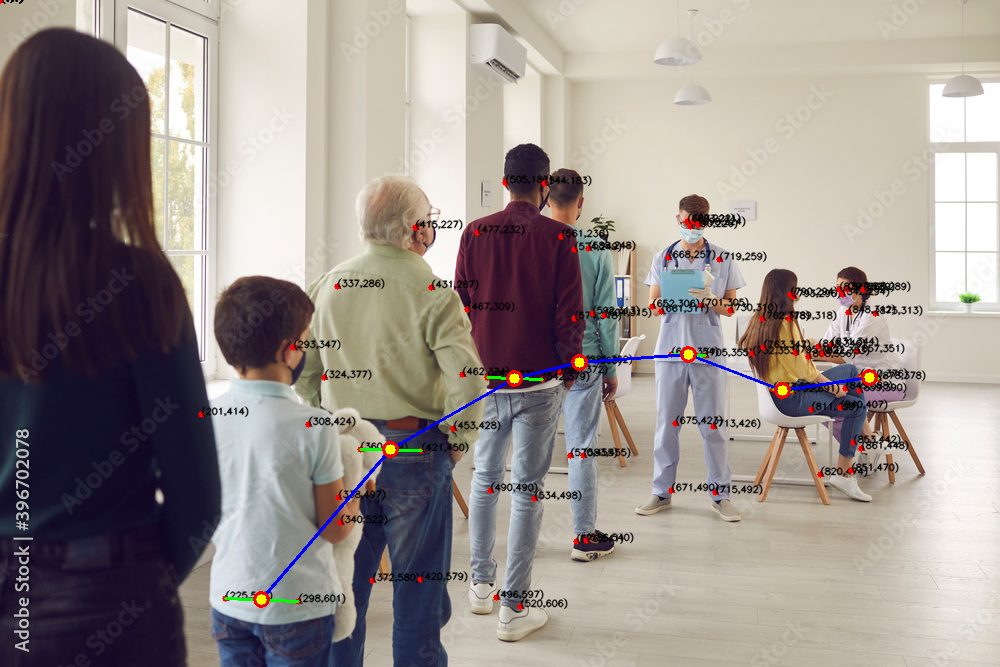

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import pandas as pd

def significant_pose_detection(arr, th):
  n = len(arr)
  i=0
  for itemm in arr:
    if np.sum(itemm[0]+itemm[1])!=0:
      i = i + 1

  sig_det = (i/n)
  if sig_det>=th:
    return 1

  return 0


# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose5.jpg"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
  landmarks = []
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    landmarks.append([x,y])

  # Create a NumPy Array from list
  detections = significant_pose_detection(landmarks, th)
  if detections==1:
    det = det + 1
    for j in range(len(landmarks)):
      x = landmarks[j][0]
      y = landmarks[j][1]
      cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
      ttext = "("+str(x)+","+str(y)+")"
      cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,0,0), 1, cv2.LINE_AA)

    # Calling DataFrame constructor on list
    df = pd.DataFrame(landmarks, columns =['x'+str(det), 'y'+str(det)], dtype = float)
    concat_df = pd.concat([concat_df, df], axis=1)

    cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
    a = (landmarks[11][0] + landmarks[12][0])//2
    b = (landmarks[11][1] + landmarks[12][1])//2
    #print(a," ",b)
    #cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
    #cv2.circle(img, (a, b), 7, (0, 0, 255), 2)
    Q.append([a,b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
# Remove empty List from List
# using list comprehension
nQ = [ele for ele in m if ele != []]


dict={}
sorted_Q=sorted(Q)
for i,point in enumerate(Q):
  j=sorted_Q.index(point)
  dict[j]=i

# print(concat_df)

#k, _, _ = results.keypoints.xy.cpu().numpy().shape
k = len(nQ)  # actual detected person after discarding zeros

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(img, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
  i = i + 1

# dataframe to csv
concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns =['x', 'y'], dtype = int)
df_nQ.to_csv('nQ_centroids.csv')


print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

667 1000
[[261, 599], [390, 449], [514, 378], [579, 362], [688, 354], [782, 390], [869, 377]]


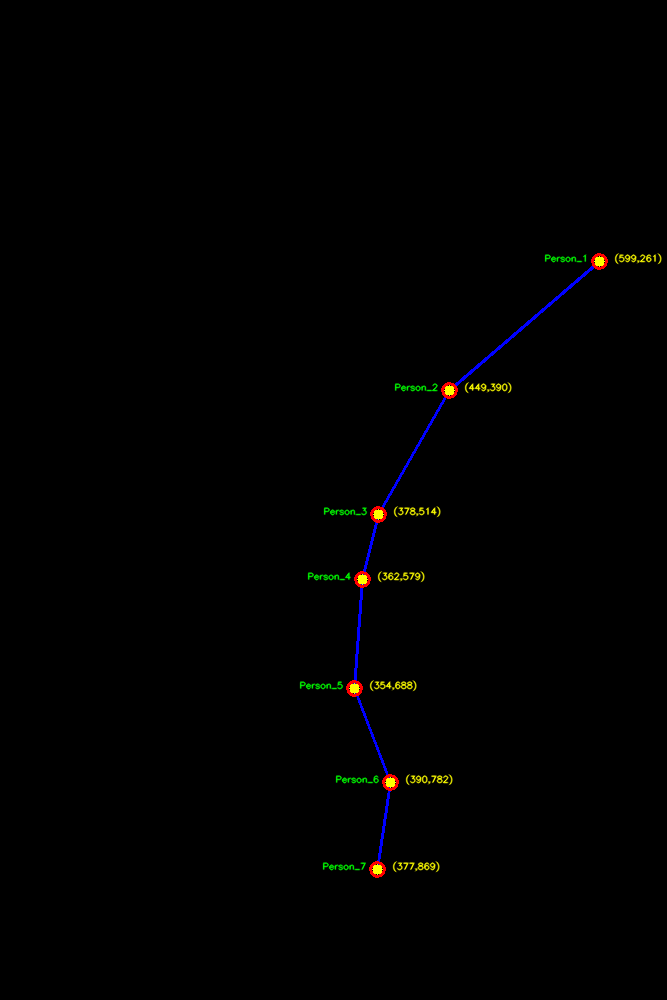

In [ ]:
image_file_name = "output.jpg"
src = cv2.imread(image_file_name)
h,w,c = src.shape
print(h,w)
canva = np.zeros([h,w,3],dtype=np.uint8)  # change the h, w
print(nQ)

nQT = [[itemm[1],itemm[0]] for itemm in nQ]

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(canva, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(canva, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(canva, nQ[i], 7, (0, 0, 255), 2)
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"

  i = i + 1

canva = cv2.rotate(canva, cv2.ROTATE_90_CLOCKWISE)
## ---------------------------------------------------------------------
# Use Flip code 0 to flip vertically
image = cv2.flip(canva, 1)
i = 0
while i<k:
  ttext = "("+str(nQT[i][0])+","+str(nQT[i][1])+")"
  cv2.putText(image, ttext, (nQ[i][1]+15, nQ[i][0]), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,255), 1, cv2.LINE_AA)
  cv2.putText(image, "Person_"+str(i+1), (nQT[i][0]-55, nQT[i][1]), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,255,0), 1, cv2.LINE_AA)
  i = i + 1


cv2.imwrite("canvas.jpg", image)
cv2_imshow(image)

In [ ]:
numPeople=len(nQ)
ev=[(nQ[-1][0]-nQ[0][0]),(nQ[-1][1]-nQ[0][1])]
ev

[608, -222]

In [ ]:
forces=[]
for _ in range(numPeople):
  forces.append([0,0])

In [ ]:
k=100

In [ ]:
import math
def findMag(v):
  return math.sqrt(v[0]**2+v[1]**2)
def findAngle(p1,p2,ev):
  v12=[(p1[0]-p2[0]),(p1[1]-p2[1])]
  value=(v12[0]*ev[0]+v12[1]*ev[1])/(findMag(v12)*findMag(ev))
  return math.acos(value)
def findDis(p1,p2):
  return math.sqrt((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)

In [ ]:
for i in range(numPeople-1):
    theta=findAngle(nQ[i+1],nQ[i],ev)
    dis=findDis(nQ[i+1],nQ[i])
    deltaDis=dis*(1-math.cos(theta))
    forces[i][0]+=(k*deltaDis*math.cos(theta))
    if(nQ[i+1][1]>nQ[i][1]):
      forces[i][1]+=(k*deltaDis*math.sin(theta))
    else:
      forces[i][1]+=(-k*deltaDis*math.sin(theta))
    forces[i+1][0]+=(-1*forces[i][0])
    forces[i+1][1]+=(-1*forces[i][1])
    print(forces)

[[2200.3784585163808, -1232.0559653608802], [-2200.3784585163808, 1232.0559653608802], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[2200.3784585163808, -1232.0559653608802], [-1997.5514225155896, 1197.2553549318], [1997.5514225155896, -1197.2553549318], [0, 0], [0, 0], [0, 0], [0, 0]]
[[2200.3784585163808, -1232.0559653608802], [-1997.5514225155896, 1197.2553549318], [2036.852052170249, -1201.5456493373583], [-2036.852052170249, 1201.5456493373583], [0, 0], [0, 0], [0, 0]]
[[2200.3784585163808, -1232.0559653608802], [-1997.5514225155896, 1197.2553549318], [2036.852052170249, -1201.5456493373583], [-1636.5852621472739, 1087.820659355225], [1636.5852621472739, -1087.820659355225], [0, 0], [0, 0]]
[[2200.3784585163808, -1232.0559653608802], [-1997.5514225155896, 1197.2553549318], [2036.852052170249, -1201.5456493373583], [-1636.5852621472739, 1087.820659355225], [3500.84548433102, 533.585159596937], [-3500.84548433102, -533.585159596937], [0, 0]]
[[2200.3784585163808, -1232.0559653608802], [

In [ ]:
print(forces)

[[2200.3784585163808, -1232.0559653608802], [-1997.5514225155896, 1197.2553549318], [2036.852052170249, -1201.5456493373583], [-1636.5852621472739, 1087.820659355225], [3500.84548433102, 533.585159596937], [-3326.0243885364866, -569.3441625551607], [3326.0243885364866, 569.3441625551607]]


In [ ]:
equivalent=[]
for force in forces:
  equivalent.append(math.sqrt(force[0]**2+force[1]**2))

In [ ]:
print(equivalent)

[2521.830141481431, 2328.8692686595627, 2364.842115210165, 1965.1374270512729, 3541.2755085848635, 3374.4023187188495, 3374.4023187188495]


In [ ]:
import cv2
import numpy as np

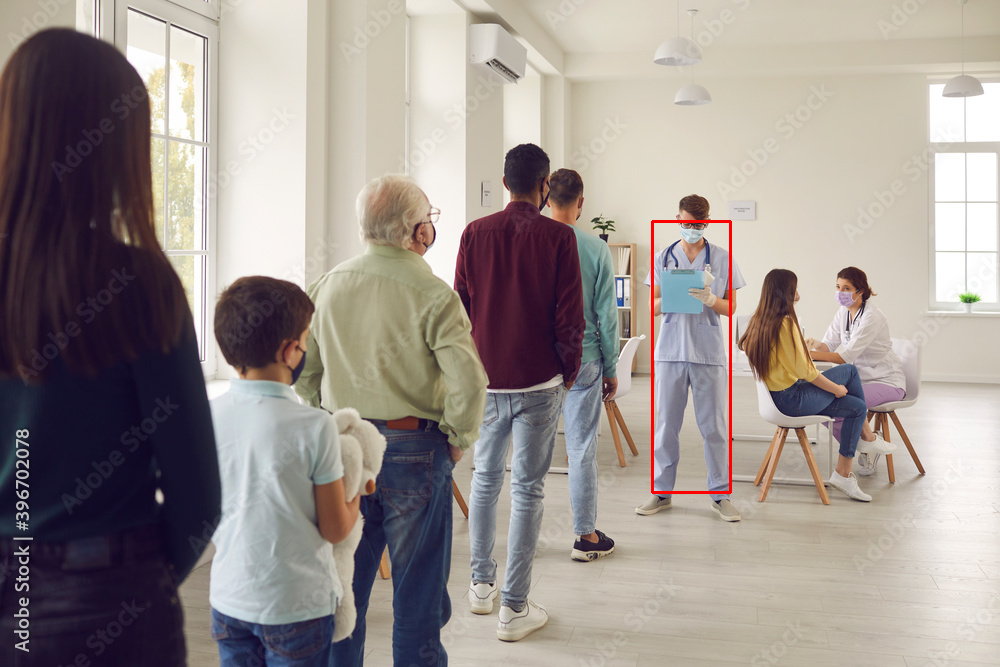

In [ ]:
def mark_outliers(nQ, tnet, threshold):
    img = cv2.imread('Q3_pose5.jpg')

    nQ = np.array(nQ, dtype=int)

    for i in range(len(nQ)):
        if tnet[i] > threshold:
            person_no = dict[i] + 1

            x = concat_df['x' + str(person_no)]
            y = concat_df['y' + str(person_no)]

            x_non_zero = [value for value in x if value != 0]
            y_non_zero = [value for value in y if value != 0]

            min_x = int(min(x_non_zero)) if x_non_zero else 0
            min_y = int(min(y_non_zero)) if y_non_zero else 0
            max_x = int(max(x_non_zero)) if x_non_zero else 0
            max_y = int(max(y_non_zero)) if y_non_zero else 0

            start_point = (min_x, min_y)
            end_point = (max_x, max_y)
            color = (0, 0, 255)
            thickness = 2
            img = cv2.rectangle(img, start_point, end_point, color, thickness)

    cv2.imwrite('output_outlier5.png', img)
    cv2_imshow(img)

threshold=3374.4023187188495
mark_outliers(nQ, equivalent, threshold)

# On another Image


image 1/1 /content/Q3_pose8.jpg: 480x640 10 persons, 13.6ms
Speed: 3.7ms preprocess, 13.6ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)

 10 Persons detected.


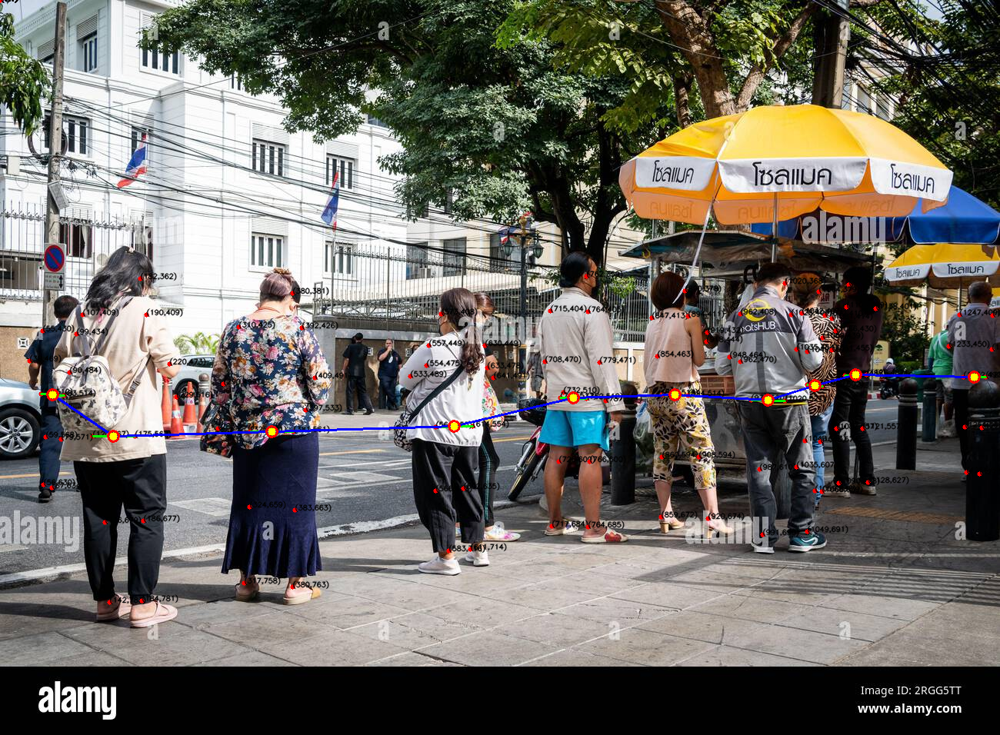

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import pandas as pd

def significant_pose_detection(arr, th):
  n = len(arr)
  i=0
  for itemm in arr:
    if np.sum(itemm[0]+itemm[1])!=0:
      i = i + 1

  sig_det = (i/n)
  if sig_det>=th:
    return 1

  return 0


# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose8.jpg"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
  landmarks = []
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    landmarks.append([x,y])

  # Create a NumPy Array from list
  detections = significant_pose_detection(landmarks, th)
  if detections==1:
    det = det + 1
    for j in range(len(landmarks)):
      x = landmarks[j][0]
      y = landmarks[j][1]
      cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
      ttext = "("+str(x)+","+str(y)+")"
      cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,0,0), 1, cv2.LINE_AA)

    # Calling DataFrame constructor on list
    df = pd.DataFrame(landmarks, columns =['x'+str(det), 'y'+str(det)], dtype = float)
    concat_df = pd.concat([concat_df, df], axis=1)

    cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
    a = (landmarks[11][0] + landmarks[12][0])//2
    b = (landmarks[11][1] + landmarks[12][1])//2
    #print(a," ",b)
    #cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
    #cv2.circle(img, (a, b), 7, (0, 0, 255), 2)
    Q.append([a,b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
# Remove empty List from List
# using list comprehension
nQ = [ele for ele in m if ele != []]


dict={}
sorted_Q=sorted(Q)
for i,point in enumerate(Q):
  j=sorted_Q.index(point)
  dict[j]=i

# print(concat_df)

#k, _, _ = results.keypoints.xy.cpu().numpy().shape
k = len(nQ)  # actual detected person after discarding zeros

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(img, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
  i = i + 1

# dataframe to csv
concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns =['x', 'y'], dtype = int)
df_nQ.to_csv('nQ_centroids.csv')


print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

956 1300
[[68, 513], [147, 567], [353, 561], [590, 554], [745, 517], [877, 513], [998, 520], [1059, 501], [1112, 487], [1266, 490]]


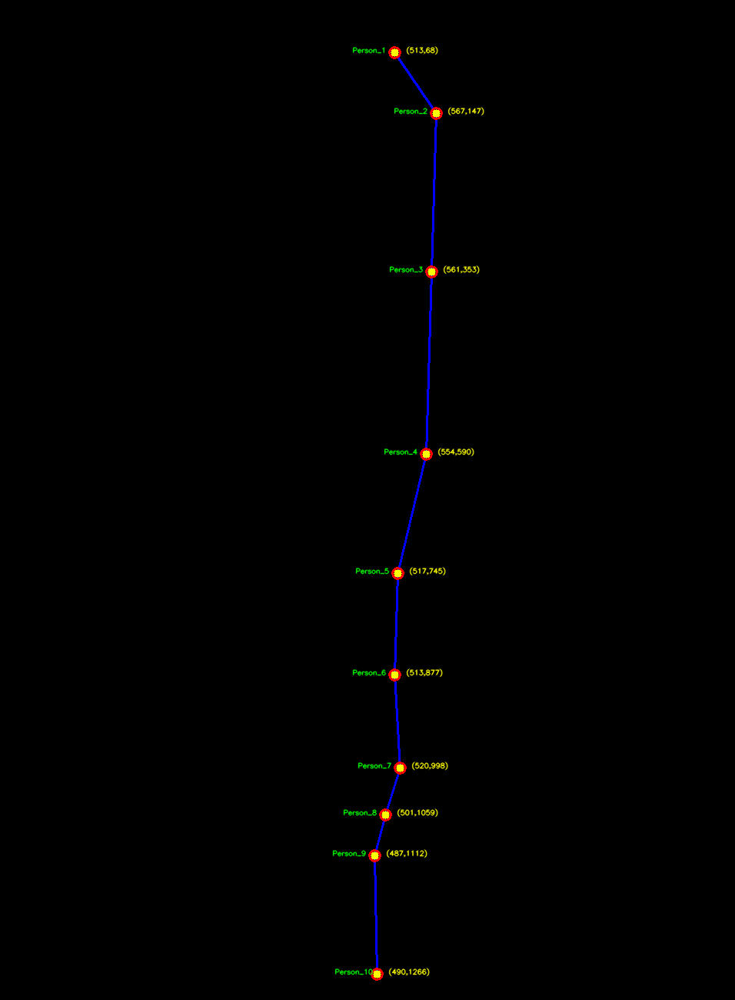

In [ ]:
image_file_name = "output.jpg"
src = cv2.imread(image_file_name)
h,w,c = src.shape
print(h,w)
canva = np.zeros([h,w,3],dtype=np.uint8)  # change the h, w
print(nQ)

nQT = [[itemm[1],itemm[0]] for itemm in nQ]

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(canva, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(canva, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(canva, nQ[i], 7, (0, 0, 255), 2)
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"

  i = i + 1

canva = cv2.rotate(canva, cv2.ROTATE_90_CLOCKWISE)
## ---------------------------------------------------------------------
# Use Flip code 0 to flip vertically
image = cv2.flip(canva, 1)
i = 0
while i<k:
  ttext = "("+str(nQT[i][0])+","+str(nQT[i][1])+")"
  cv2.putText(image, ttext, (nQ[i][1]+15, nQ[i][0]), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,255), 1, cv2.LINE_AA)
  cv2.putText(image, "Person_"+str(i+1), (nQT[i][0]-55, nQT[i][1]), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,255,0), 1, cv2.LINE_AA)
  i = i + 1


cv2.imwrite("canvas.jpg", image)
cv2_imshow(image)

In [ ]:
numPeople=len(nQ)
ev=[(nQ[-1][0]-nQ[0][0]),(nQ[-1][1]-nQ[0][1])]
ev

[1198, -23]

In [ ]:
forces=[]
for _ in range(numPeople):
  forces.append([0,0])

In [ ]:
k=100

In [ ]:
import math
def findMag(v):
  return math.sqrt(v[0]**2+v[1]**2)
def findAngle(p1,p2,ev):
  v12=[(p1[0]-p2[0]),(p1[1]-p2[1])]
  value=(v12[0]*ev[0]+v12[1]*ev[1])/(findMag(v12)*findMag(ev))
  return math.acos(value)
def findDis(p1,p2):
  return math.sqrt((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)

In [ ]:
for i in range(numPeople-1):
    theta=findAngle(nQ[i+1],nQ[i],ev)
    dis=findDis(nQ[i+1],nQ[i])
    deltaDis=dis*(1-math.cos(theta))
    forces[i][0]+=(k*deltaDis*math.cos(theta))
    if(nQ[i+1][1]>nQ[i][1]):
      forces[i][1]+=(k*deltaDis*math.sin(theta))
    else:
      forces[i][1]+=(-k*deltaDis*math.sin(theta))
    forces[i+1][0]+=(-1*forces[i][0])
    forces[i+1][1]+=(-1*forces[i][1])
    print(forces)

[[1445.3332563612803, 1029.204170742317], [-1445.3332563612803, -1029.204170742317], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[1445.3332563612803, 1029.204170742317], [-1444.3189563134017, -1029.2142346283288], [1444.3189563134017, 1029.2142346283288], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[1445.3332563612803, 1029.204170742317], [-1444.3189563134017, -1029.2142346283288], [1445.5841681577654, 1029.2011632918607], [-1445.5841681577654, -1029.2011632918607], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[1445.3332563612803, 1029.204170742317], [-1444.3189563134017, -1029.2142346283288], [1445.5841681577654, 1029.2011632918607], [-1086.7226820028384, -1107.6158444459286], [1086.7226820028384, 1107.6158444459286], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[1445.3332563612803, 1029.204170742317], [-1444.3189563134017, -1029.2142346283288], [1445.5841681577654, 1029.2011632918607], [-1086.7226820028384, -1107.6158444459286], [1087.5358096594612, 

In [ ]:
print(forces)

[[1445.3332563612803, 1029.204170742317], [-1444.3189563134017, -1029.2142346283288], [1445.5841681577654, 1029.2011632918607], [-1086.7226820028384, -1107.6158444459286], [1087.5358096594612, 1107.6068204289086], [-1051.7451716375087, -1104.8460889492012], [1295.376896278025, 1034.0614870775178], [-1143.9187999268272, -1070.9742953473904], [1155.4278751533768, 1071.4196235375655], [-1155.4278751533768, -1071.4196235375655]]


In [ ]:
equivalent=[]
for force in forces:
  equivalent.append(math.sqrt(force[0]**2+force[1]**2))

In [ ]:
print(equivalent)

[1774.33070396059, 1773.510413932721, 1774.5333532367595, 1551.7019837736593, 1552.2651210254955, 1525.4024997780616, 1657.493427579083, 1567.0150484666292, 1575.7390597376286, 1575.7390597376286]


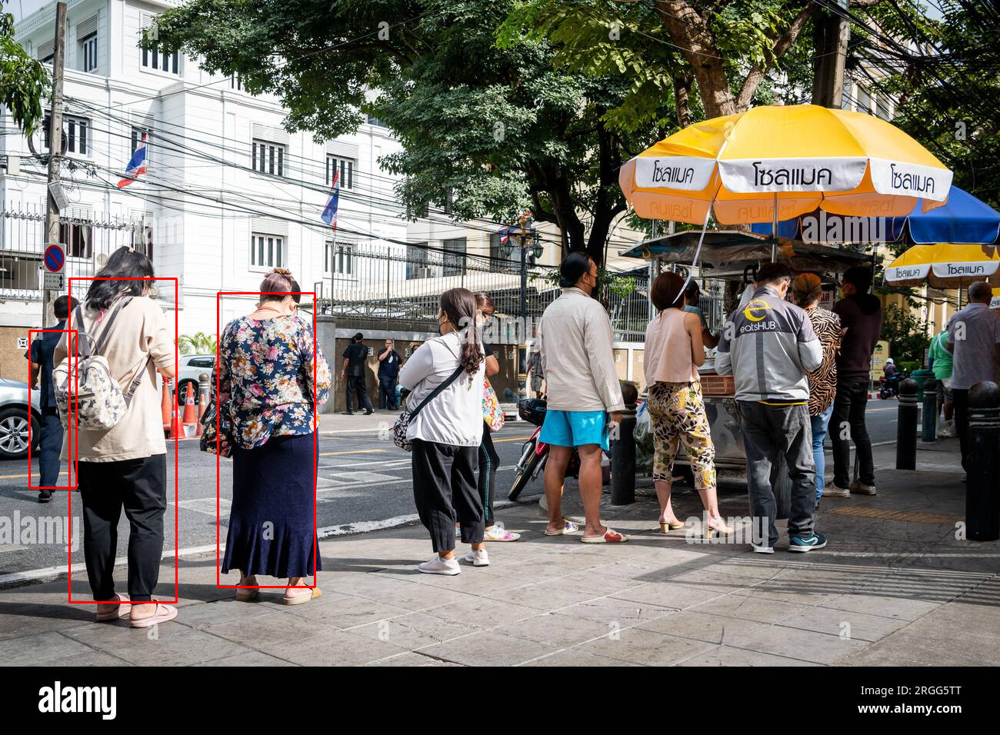

In [ ]:
def mark_outliers(nQ, tnet, threshold):
    img = cv2.imread('Q3_pose8.jpg')

    nQ = np.array(nQ, dtype=int)

    for i in range(len(nQ)):
        if tnet[i] > threshold:
            person_no = dict[i] + 1

            x = concat_df['x' + str(person_no)]
            y = concat_df['y' + str(person_no)]

            x_non_zero = [value for value in x if value != 0]
            y_non_zero = [value for value in y if value != 0]

            min_x = int(min(x_non_zero)) if x_non_zero else 0
            min_y = int(min(y_non_zero)) if y_non_zero else 0
            max_x = int(max(x_non_zero)) if x_non_zero else 0
            max_y = int(max(y_non_zero)) if y_non_zero else 0

            start_point = (min_x, min_y)
            end_point = (max_x, max_y)
            color = (0, 0, 255)
            thickness = 2
            img = cv2.rectangle(img, start_point, end_point, color, thickness)

    cv2.imwrite('output_outlier8.png', img)
    cv2_imshow(img)

threshold=1657.493427579083
mark_outliers(nQ, equivalent, threshold)

# On another Image


image 1/1 /content/Q3_pose6.jpg: 544x640 8 persons, 14.1ms
Speed: 4.1ms preprocess, 14.1ms inference, 2.4ms postprocess per image at shape (1, 3, 544, 640)

 7 Persons detected.


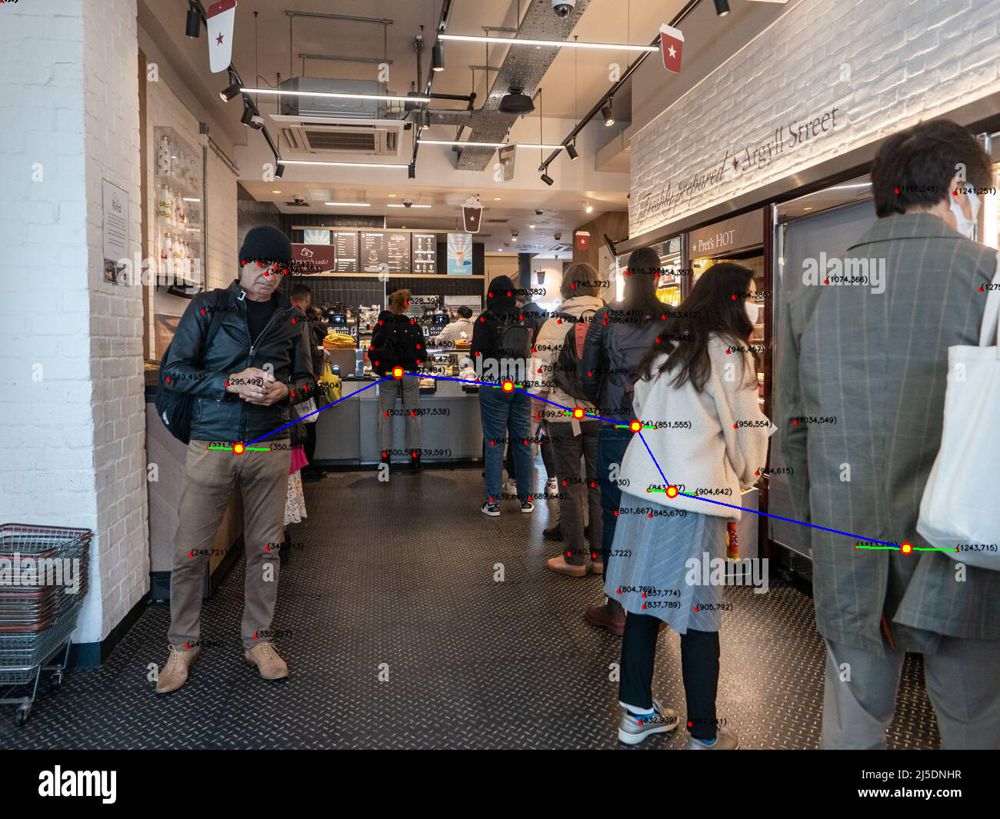

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import pandas as pd

def significant_pose_detection(arr, th):
  n = len(arr)
  i=0
  for itemm in arr:
    if np.sum(itemm[0]+itemm[1])!=0:
      i = i + 1

  sig_det = (i/n)
  if sig_det>=th:
    return 1

  return 0


# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose6.jpg"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
  landmarks = []
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    landmarks.append([x,y])

  # Create a NumPy Array from list
  detections = significant_pose_detection(landmarks, th)
  if detections==1:
    det = det + 1
    for j in range(len(landmarks)):
      x = landmarks[j][0]
      y = landmarks[j][1]
      cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
      ttext = "("+str(x)+","+str(y)+")"
      cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,0,0), 1, cv2.LINE_AA)

    # Calling DataFrame constructor on list
    df = pd.DataFrame(landmarks, columns =['x'+str(det), 'y'+str(det)], dtype = float)
    concat_df = pd.concat([concat_df, df], axis=1)

    cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
    a = (landmarks[11][0] + landmarks[12][0])//2
    b = (landmarks[11][1] + landmarks[12][1])//2
    #print(a," ",b)
    #cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
    #cv2.circle(img, (a, b), 7, (0, 0, 255), 2)
    Q.append([a,b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
# Remove empty List from List
# using list comprehension
nQ = [ele for ele in m if ele != []]


dict={}
sorted_Q=sorted(Q)
for i,point in enumerate(Q):
  j=sorted_Q.index(point)
  dict[j]=i

# print(concat_df)

#k, _, _ = results.keypoints.xy.cpu().numpy().shape
k = len(nQ)  # actual detected person after discarding zeros

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(img, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
  i = i + 1

# dataframe to csv
concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns =['x', 'y'], dtype = int)
df_nQ.to_csv('nQ_centroids.csv')


print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

1065 1300
[[310, 583], [517, 484], [660, 502], [752, 537], [826, 554], [873, 639], [1178, 713]]


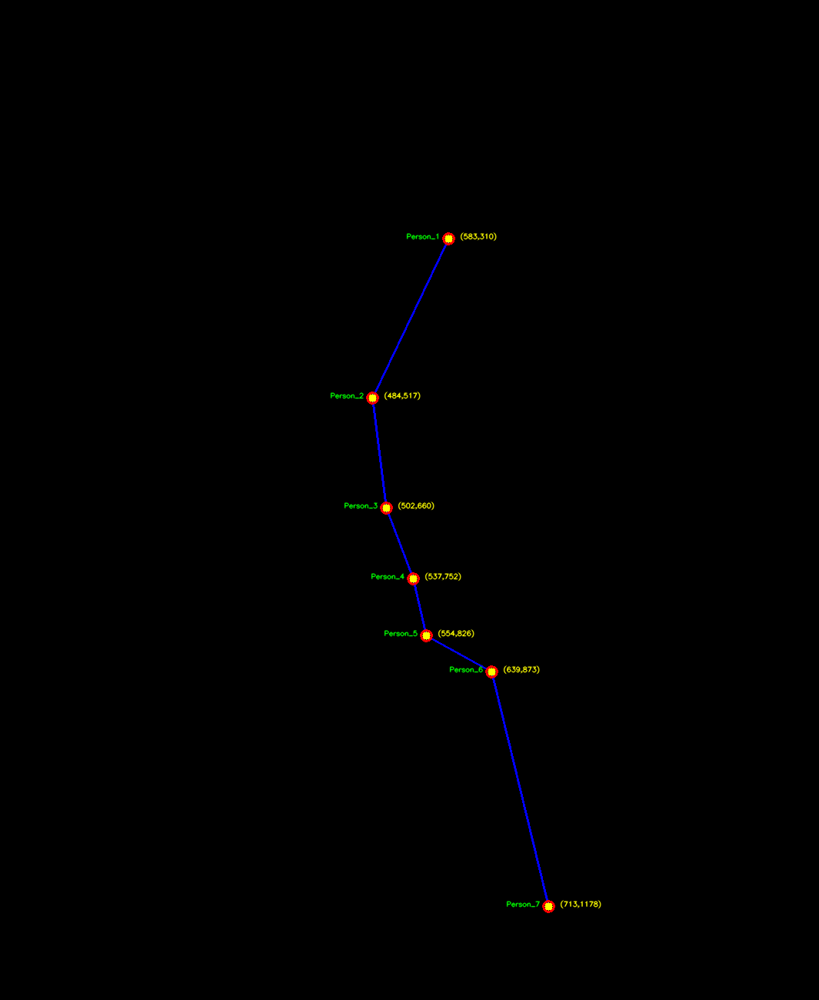

In [ ]:
image_file_name = "output.jpg"
src = cv2.imread(image_file_name)
h,w,c = src.shape
print(h,w)
canva = np.zeros([h,w,3],dtype=np.uint8)  # change the h, w
print(nQ)

nQT = [[itemm[1],itemm[0]] for itemm in nQ]

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(canva, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(canva, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(canva, nQ[i], 7, (0, 0, 255), 2)
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"

  i = i + 1

canva = cv2.rotate(canva, cv2.ROTATE_90_CLOCKWISE)
## ---------------------------------------------------------------------
# Use Flip code 0 to flip vertically
image = cv2.flip(canva, 1)
i = 0
while i<k:
  ttext = "("+str(nQT[i][0])+","+str(nQT[i][1])+")"
  cv2.putText(image, ttext, (nQ[i][1]+15, nQ[i][0]), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,255), 1, cv2.LINE_AA)
  cv2.putText(image, "Person_"+str(i+1), (nQT[i][0]-55, nQT[i][1]), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,255,0), 1, cv2.LINE_AA)
  i = i + 1


cv2.imwrite("canvas.jpg", image)
cv2_imshow(image)

In [ ]:
numPeople=len(nQ)
ev=[(nQ[-1][0]-nQ[0][0]),(nQ[-1][1]-nQ[0][1])]
forces=[]
for _ in range(numPeople):
  forces.append([0,0])

In [ ]:
for i in range(numPeople-1):
    theta=findAngle(nQ[i+1],nQ[i],ev)
    dis=findDis(nQ[i+1],nQ[i])
    deltaDis=dis*(1-math.cos(theta))
    forces[i][0]+=(k*deltaDis*math.cos(theta))
    if(nQ[i+1][1]>nQ[i][1]):
      forces[i][1]+=(k*deltaDis*math.sin(theta))
    else:
      forces[i][1]+=(-k*deltaDis*math.sin(theta))
    forces[i+1][0]+=(-1*forces[i][0])
    forces[i+1][1]+=(-1*forces[i][1])
    print(forces)
equivalent=[]
for force in forces:
  equivalent.append(math.sqrt(force[0]**2+force[1]**2))
print(f"\n{equivalent}")

[[228.45500082475476, -154.54671416535967], [-228.45500082475476, 154.54671416535967], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[228.45500082475476, -154.54671416535967], [-228.17771505076743, 154.55321743590028], [228.17771505076743, -154.55321743590028], [0, 0], [0, 0], [0, 0], [0, 0]]
[[228.45500082475476, -154.54671416535967], [-228.17771505076743, 154.55321743590028], [243.65709555763775, -151.17513780961127], [-243.65709555763775, 151.17513780961127], [0, 0], [0, 0], [0, 0]]
[[228.45500082475476, -154.54671416535967], [-228.17771505076743, 154.55321743590028], [243.65709555763775, -151.17513780961127], [-242.08094510353044, 151.29697503203528], [242.08094510353044, -151.29697503203528], [0, 0], [0, 0]]
[[228.45500082475476, -154.54671416535967], [-228.17771505076743, 154.55321743590028], [243.65709555763775, -151.17513780961127], [-242.08094510353044, 151.29697503203528], [404.0997986958654, 60.17191017788073], [-404.0997986958654, -60.17191017788073], [0, 0]]
[[228.4550008247547

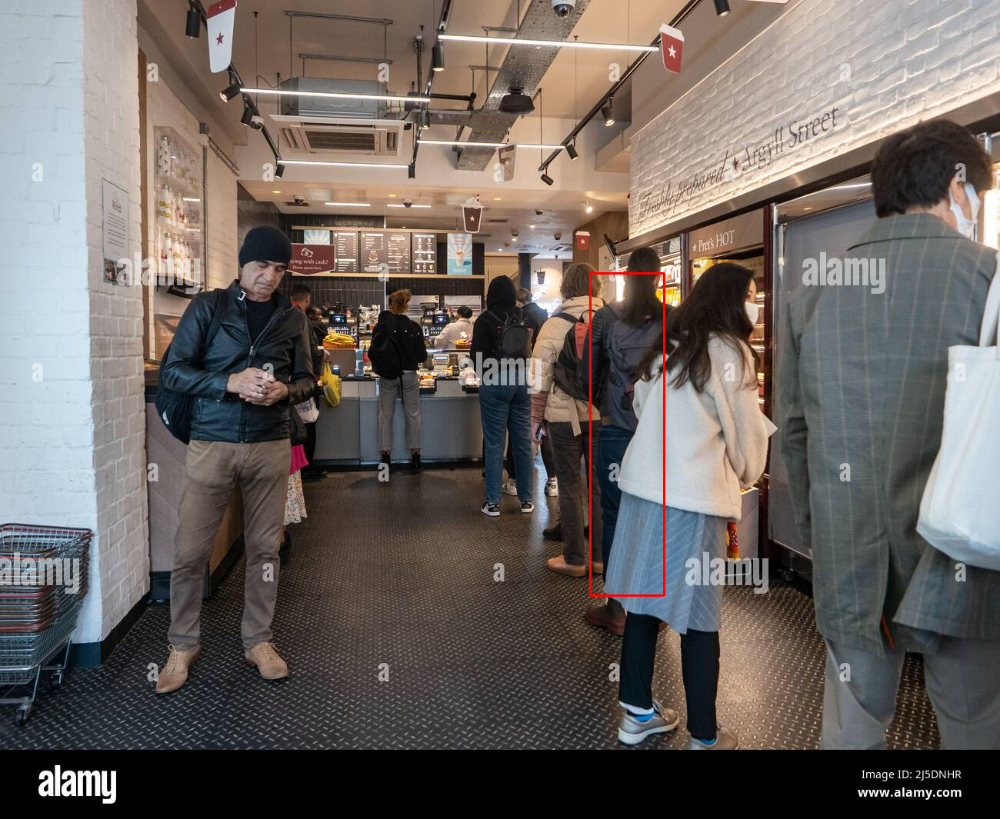

In [ ]:
def mark_outliers(nQ, tnet, threshold):
    img = cv2.imread('Q3_pose6.jpg')

    nQ = np.array(nQ, dtype=int)

    for i in range(len(nQ)):
        if tnet[i] > threshold:
            person_no = dict[i] + 1

            x = concat_df['x' + str(person_no)]
            y = concat_df['y' + str(person_no)]

            x_non_zero = [value for value in x if value != 0]
            y_non_zero = [value for value in y if value != 0]

            min_x = int(min(x_non_zero)) if x_non_zero else 0
            min_y = int(min(y_non_zero)) if y_non_zero else 0
            max_x = int(max(x_non_zero)) if x_non_zero else 0
            max_y = int(max(y_non_zero)) if y_non_zero else 0

            start_point = (min_x, min_y)
            end_point = (max_x, max_y)
            color = (0, 0, 255)
            thickness = 2
            img = cv2.rectangle(img, start_point, end_point, color, thickness)

    cv2.imwrite('output_outlier6.png', img)
    cv2_imshow(img)

threshold=6006.251031441
mark_outliers(nQ, equivalent, threshold)

# On another Image


image 1/1 /content/Q3_pose3.jpg: 448x640 10 persons, 10.9ms
Speed: 3.4ms preprocess, 10.9ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)

 9 Persons detected.


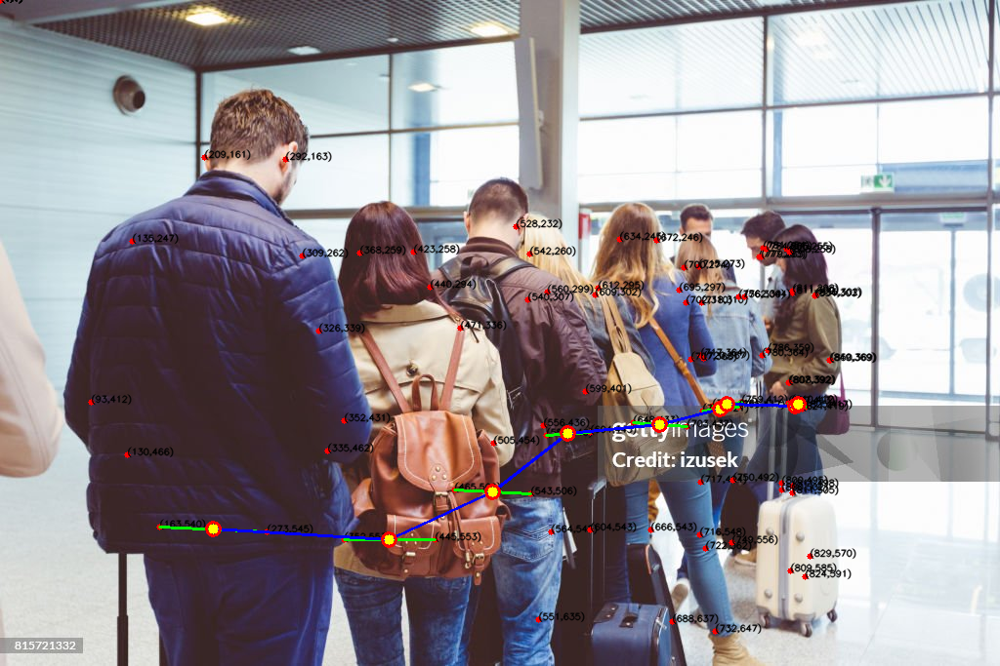

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import pandas as pd

def significant_pose_detection(arr, th):
  n = len(arr)
  i=0
  for itemm in arr:
    if np.sum(itemm[0]+itemm[1])!=0:
      i = i + 1

  sig_det = (i/n)
  if sig_det>=th:
    return 1

  return 0


# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose3.jpg"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
  landmarks = []
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    landmarks.append([x,y])

  # Create a NumPy Array from list
  detections = significant_pose_detection(landmarks, th)
  if detections==1:
    det = det + 1
    for j in range(len(landmarks)):
      x = landmarks[j][0]
      y = landmarks[j][1]
      cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
      ttext = "("+str(x)+","+str(y)+")"
      cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,0,0), 1, cv2.LINE_AA)

    # Calling DataFrame constructor on list
    df = pd.DataFrame(landmarks, columns =['x'+str(det), 'y'+str(det)], dtype = float)
    concat_df = pd.concat([concat_df, df], axis=1)

    cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
    a = (landmarks[11][0] + landmarks[12][0])//2
    b = (landmarks[11][1] + landmarks[12][1])//2
    #print(a," ",b)
    #cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
    #cv2.circle(img, (a, b), 7, (0, 0, 255), 2)
    Q.append([a,b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
# Remove empty List from List
# using list comprehension
nQ = [ele for ele in m if ele != []]


dict={}
sorted_Q=sorted(Q)
for i,point in enumerate(Q):
  j=sorted_Q.index(point)
  dict[j]=i

# print(concat_df)

#k, _, _ = results.keypoints.xy.cpu().numpy().shape
k = len(nQ)  # actual detected person after discarding zeros

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(img, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
  i = i + 1

# dataframe to csv
concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns =['x', 'y'], dtype = int)
df_nQ.to_csv('nQ_centroids.csv')


print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

683 1024
[[218, 542], [398, 553], [504, 504], [581, 444], [675, 435], [737, 419], [744, 414], [814, 416], [817, 414]]


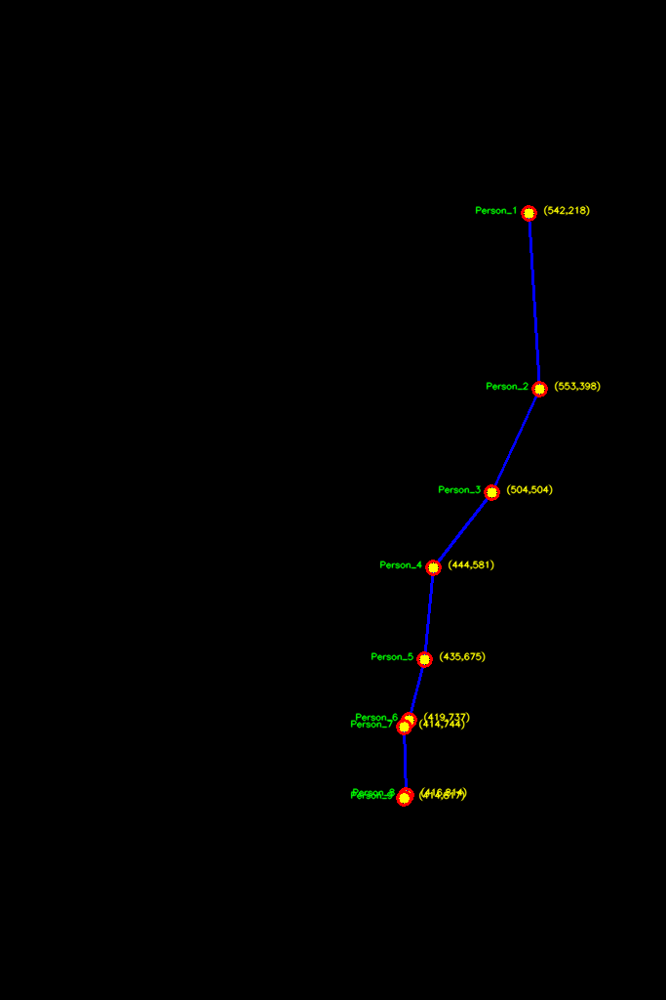

In [ ]:
image_file_name = "output.jpg"
src = cv2.imread(image_file_name)
h,w,c = src.shape
print(h,w)
canva = np.zeros([h,w,3],dtype=np.uint8)  # change the h, w
print(nQ)

nQT = [[itemm[1],itemm[0]] for itemm in nQ]

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(canva, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(canva, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(canva, nQ[i], 7, (0, 0, 255), 2)
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"

  i = i + 1

canva = cv2.rotate(canva, cv2.ROTATE_90_CLOCKWISE)
## ---------------------------------------------------------------------
# Use Flip code 0 to flip vertically
image = cv2.flip(canva, 1)
i = 0
while i<k:
  ttext = "("+str(nQT[i][0])+","+str(nQT[i][1])+")"
  cv2.putText(image, ttext, (nQ[i][1]+15, nQ[i][0]), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,255), 1, cv2.LINE_AA)
  cv2.putText(image, "Person_"+str(i+1), (nQT[i][0]-55, nQT[i][1]), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,255,0), 1, cv2.LINE_AA)
  i = i + 1


cv2.imwrite("canvas.jpg", image)
cv2_imshow(image)

In [ ]:
numPeople=len(nQ)
ev=[(nQ[-1][0]-nQ[0][0]),(nQ[-1][1]-nQ[0][1])]
forces=[]
for _ in range(numPeople):
  forces.append([0,0])
for i in range(numPeople-1):
    theta=findAngle(nQ[i+1],nQ[i],ev)
    dis=findDis(nQ[i+1],nQ[i])
    deltaDis=dis*(1-math.cos(theta))
    forces[i][0]+=(k*deltaDis*math.cos(theta))
    if(nQ[i+1][1]>nQ[i][1]):
      forces[i][1]+=(k*deltaDis*math.sin(theta))
    else:
      forces[i][1]+=(-k*deltaDis*math.sin(theta))
    forces[i+1][0]+=(-1*forces[i][0])
    forces[i+1][1]+=(-1*forces[i][1])
    print(forces)
equivalent=[]
for force in forces:
  equivalent.append(math.sqrt(force[0]**2+force[1]**2))
print(f"\n{equivalent}")

[[57.297594467342854, 15.953749825892816], [-57.297594467342854, -15.953749825892816], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[57.297594467342854, 15.953749825892816], [-32.03175309491219, -21.669582385894447], [32.03175309491219, 21.669582385894447], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[57.297594467342854, 15.953749825892816], [-32.03175309491219, -21.669582385894447], [111.22119693345051, -16.721909781539214], [-111.22119693345051, 16.721909781539214], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]
[[57.297594467342854, 15.953749825892816], [-32.03175309491219, -21.669582385894447], [111.22119693345051, -16.721909781539214], [-105.63801952225091, 16.076605712692814], [105.63801952225091, -16.076605712692814], [0, 0], [0, 0], [0, 0], [0, 0]]
[[57.297594467342854, 15.953749825892816], [-32.03175309491219, -21.669582385894447], [111.22119693345051, -16.721909781539214], [-105.63801952225091, 16.076605712692814], [106.14652733178897, -16.097991433871773], [-106.14

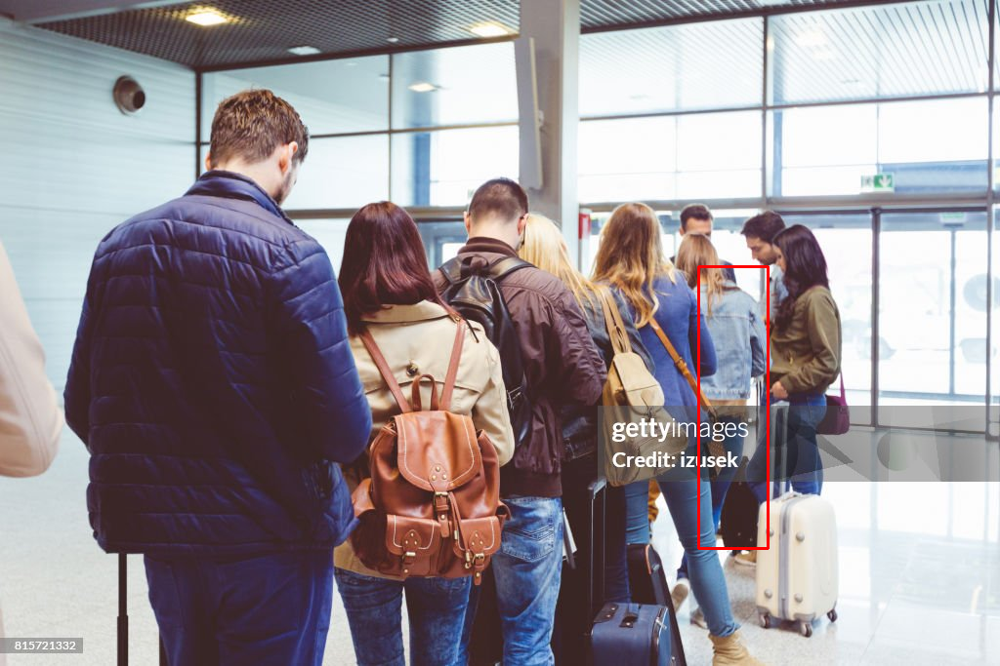

In [ ]:
def mark_outliers(nQ, tnet, threshold):
    img = cv2.imread('Q3_pose3.jpg')

    nQ = np.array(nQ, dtype=int)

    for i in range(len(nQ)):
        if tnet[i] > threshold:
            person_no = dict[i] + 1

            x = concat_df['x' + str(person_no)]
            y = concat_df['y' + str(person_no)]

            x_non_zero = [value for value in x if value != 0]
            y_non_zero = [value for value in y if value != 0]

            min_x = int(min(x_non_zero)) if x_non_zero else 0
            min_y = int(min(y_non_zero)) if y_non_zero else 0
            max_x = int(max(x_non_zero)) if x_non_zero else 0
            max_y = int(max(y_non_zero)) if y_non_zero else 0

            start_point = (min_x, min_y)
            end_point = (max_x, max_y)
            color = (0, 0, 255)
            thickness = 2
            img = cv2.rectangle(img, start_point, end_point, color, thickness)

    cv2.imwrite('output_outlier3.png', img)
    cv2_imshow(img)

threshold=115.87205723100385
mark_outliers(nQ, equivalent, threshold)

# On video


In [ ]:
import cv2
import numpy as np
import pandas as pd
import math
from ultralytics import YOLO

def significant_pose_detection(arr, th):
    n = len(arr)
    i = 0
    for itemm in arr:
        if np.sum(itemm[0] + itemm[1]) != 0:
            i = i + 1

    sig_det = (i / n)
    if sig_det >= th:
        return 1

    return 0

def findAngle(p1, p2, ev):
    dot = p1[0] * ev[0] + p1[1] * ev[1]
    det = p1[0] * ev[1] - p1[1] * ev[0]
    angle = np.arctan2(det, dot)
    return angle

def findDis(p1, p2):
    return np.linalg.norm(np.array(p1) - np.array(p2))

def process_video(input_video_path, output_video_path):
    # Open the video file
    video = cv2.VideoCapture(input_video_path)

    # Get the video's frame rate
    fps = video.get(cv2.CAP_PROP_FPS)

    # Get the video's width and height
    frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Create a VideoWriter object to write processed frames to a new video file
    out = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

    model = YOLO('yolov8n-pose.pt')
    th = 0.3

    while True:
        # Read the next frame from the video
        ret, frame = video.read()

        # If the frame was not successfully read, then we have reached the end of the video
        if not ret:
            break

        results = model.predict(frame)[0]
        Q = []
        det = 0
        concat_df = pd.DataFrame()

        for result in results:
            landmarks = []
            kpts = result.keypoints
            nk = kpts.shape[1]

            for i in range(nk):
                keypoint = kpts.xy[0, i]
                x, y = int(keypoint[0].item()), int(keypoint[1].item())
                landmarks.append([x, y])

            # Create a NumPy Array from list
            detections = significant_pose_detection(landmarks, th)
            if detections == 1:
                det = det + 1
                # Commenting out the code that draws circles and text on keypoints
                # for j in range(len(landmarks)):
                #     x = landmarks[j][0]
                #     y = landmarks[j][1]
                #     cv2.circle(frame, (x, y), 3, (0, 0, 255), -1)
                #     ttext = "("+str(x)+","+str(y)+")"
                #     cv2.putText(frame, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                #                 0.3, (0, 0, 0), 1, cv2.LINE_AA)

                # Calling DataFrame constructor on list
                df = pd.DataFrame(landmarks, columns=['x'+str(det), 'y'+str(det)], dtype=float)
                concat_df = pd.concat([concat_df, df], axis=1)

                # Commenting out the line drawing code
                # cv2.line(frame, tuple(landmarks[11]), tuple(landmarks[12]), (0, 255, 0), 2)
                a = (landmarks[11][0] + landmarks[12][0]) // 2
                b = (landmarks[11][1] + landmarks[12][1]) // 2
                Q.append([a, b])

        m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
        nQ = [ele for ele in m if ele != []]

        dict = {}
        sorted_Q = sorted(Q)
        for i, point in enumerate(Q):
            j = sorted_Q.index(point)
            dict[j] = i

        k = len(nQ)

        # Commenting out the lines that draw connections between people
        # i = 0
        # while i < (k - 1):
        #     cv2.line(frame, tuple(nQ[i]), tuple(nQ[i + 1]), (255, 0, 0), 2)
        #     i = i + 1

        # Commenting out the circles on the centroids
        # i = 0
        # while i < k:
        #     cv2.circle(frame, tuple(nQ[i]), 5, (0, 255, 255), -1)
        #     cv2.circle(frame, tuple(nQ[i]), 7, (0, 0, 255), 2)
        #     i = i + 1

        concat_df.to_csv('detected_pose.csv')
        df_nQ = pd.DataFrame(nQ, columns=['x', 'y'], dtype=int)
        df_nQ.to_csv('nQ_centroids.csv')

        numPeople = len(nQ)
        ev = [(nQ[-1][0] - nQ[0][0]), (nQ[-1][1] - nQ[0][1])]
        forces = []
        for _ in range(numPeople):
            forces.append([0, 0])
        for i in range(numPeople - 1):
            theta = findAngle(nQ[i + 1], nQ[i], ev)
            dis = findDis(nQ[i + 1], nQ[i])
            deltaDis = dis * (1 - math.cos(theta))
            forces[i][0] += (k * deltaDis * math.cos(theta))
            if nQ[i + 1][1] > nQ[i][1]:
                forces[i][1] += (k * deltaDis * math.sin(theta))
            else:
                forces[i][1] += (-k * deltaDis * math.sin(theta))
            forces[i + 1][0] += (-1 * forces[i][0])
            forces[i + 1][1] += (-1 * forces[i][1])
            # print(forces)
        equivalent = []
        for force in forces:
            equivalent.append(math.sqrt(force[0] ** 2 + force[1] ** 2))
        # print(f"\n{equivalent}")

        def mark_outliers(nQ, tnet, threshold):
            nQ = np.array(nQ, dtype=int)

            for i in range(len(nQ)):
                if tnet[i] > threshold:
                    person_no = dict[i] + 1

                    x = concat_df['x' + str(person_no)]
                    y = concat_df['y' + str(person_no)]

                    x_non_zero = [value for value in x if value != 0]
                    y_non_zero = [value for value in y if value != 0]

                    min_x = int(min(x_non_zero)) if x_non_zero else 0
                    min_y = int(min(y_non_zero)) if y_non_zero else 0
                    max_x = int(max(x_non_zero)) if x_non_zero else 0
                    max_y = int(max(y_non_zero)) if y_non_zero else 0

                    start_point = (min_x, min_y)
                    end_point = (max_x, max_y)
                    color = (0, 0, 255)
                    thickness = 2
                    cv2.rectangle(frame, start_point, end_point, color, thickness)

            out.write(frame)

        threshold = max(equivalent)-1
        mark_outliers(nQ, equivalent, threshold)

    video.release()
    out.release()

process_video('people_in_queue.mp4', 'output_video.mp4')


0: 384x640 11 persons, 8.7ms
Speed: 1.1ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 9.6ms
Speed: 1.2ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 9.3ms
Speed: 1.2ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 9.5ms
Speed: 1.3ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 9.3ms
Speed: 1.4ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 9.5ms
Speed: 1.2ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 9.9ms
Speed: 1.2ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 38

# On another Video

In [ ]:
import cv2
import numpy as np
import pandas as pd
import math
from ultralytics import YOLO

def significant_pose_detection(arr, th):
    n = len(arr)
    i = 0
    for itemm in arr:
        if np.sum(itemm[0] + itemm[1]) != 0:
            i = i + 1

    sig_det = (i / n)
    if sig_det >= th:
        return 1

    return 0

def findAngle(p1, p2, ev):
    dot = p1[0] * ev[0] + p1[1] * ev[1]
    det = p1[0] * ev[1] - p1[1] * ev[0]
    angle = np.arctan2(det, dot)
    return angle

def findDis(p1, p2):
    return np.linalg.norm(np.array(p1) - np.array(p2))

def process_video(input_video_path, output_video_path):
    # Open the video file
    video = cv2.VideoCapture(input_video_path)

    # Get the video's frame rate
    fps = video.get(cv2.CAP_PROP_FPS)

    # Get the video's width and height
    frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Create a VideoWriter object to write processed frames to a new video file
    out = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

    model = YOLO('yolov8n-pose.pt')
    th = 0.3

    while True:
        # Read the next frame from the video
        ret, frame = video.read()

        # If the frame was not successfully read, then we have reached the end of the video
        if not ret:
            break

        results = model.predict(frame)[0]
        Q = []
        det = 0
        concat_df = pd.DataFrame()

        for result in results:
            landmarks = []
            kpts = result.keypoints
            nk = kpts.shape[1]

            for i in range(nk):
                keypoint = kpts.xy[0, i]
                x, y = int(keypoint[0].item()), int(keypoint[1].item())
                landmarks.append([x, y])

            # Create a NumPy Array from list
            detections = significant_pose_detection(landmarks, th)
            if detections == 1:
                det = det + 1
                # Commenting out the code that draws circles and text on keypoints
                # for j in range(len(landmarks)):
                #     x = landmarks[j][0]
                #     y = landmarks[j][1]
                #     cv2.circle(frame, (x, y), 3, (0, 0, 255), -1)
                #     ttext = "("+str(x)+","+str(y)+")"
                #     cv2.putText(frame, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                #                 0.3, (0, 0, 0), 1, cv2.LINE_AA)

                # Calling DataFrame constructor on list
                df = pd.DataFrame(landmarks, columns=['x'+str(det), 'y'+str(det)], dtype=float)
                concat_df = pd.concat([concat_df, df], axis=1)

                # Commenting out the line drawing code
                # cv2.line(frame, tuple(landmarks[11]), tuple(landmarks[12]), (0, 255, 0), 2)
                a = (landmarks[11][0] + landmarks[12][0]) // 2
                b = (landmarks[11][1] + landmarks[12][1]) // 2
                Q.append([a, b])

        m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
        nQ = [ele for ele in m if ele != []]

        dict = {}
        sorted_Q = sorted(Q)
        for i, point in enumerate(Q):
            j = sorted_Q.index(point)
            dict[j] = i

        k = len(nQ)

        # Commenting out the lines that draw connections between people
        # i = 0
        # while i < (k - 1):
        #     cv2.line(frame, tuple(nQ[i]), tuple(nQ[i + 1]), (255, 0, 0), 2)
        #     i = i + 1

        # Commenting out the circles on the centroids
        # i = 0
        # while i < k:
        #     cv2.circle(frame, tuple(nQ[i]), 5, (0, 255, 255), -1)
        #     cv2.circle(frame, tuple(nQ[i]), 7, (0, 0, 255), 2)
        #     i = i + 1

        concat_df.to_csv('detected_pose.csv')
        df_nQ = pd.DataFrame(nQ, columns=['x', 'y'], dtype=int)
        df_nQ.to_csv('nQ_centroids.csv')

        numPeople = len(nQ)
        ev = [(nQ[-1][0] - nQ[0][0]), (nQ[-1][1] - nQ[0][1])]
        forces = []
        for _ in range(numPeople):
            forces.append([0, 0])
        for i in range(numPeople - 1):
            theta = findAngle(nQ[i + 1], nQ[i], ev)
            dis = findDis(nQ[i + 1], nQ[i])
            deltaDis = dis * (1 - math.cos(theta))
            forces[i][0] += (k * deltaDis * math.cos(theta))
            if nQ[i + 1][1] > nQ[i][1]:
                forces[i][1] += (k * deltaDis * math.sin(theta))
            else:
                forces[i][1] += (-k * deltaDis * math.sin(theta))
            forces[i + 1][0] += (-1 * forces[i][0])
            forces[i + 1][1] += (-1 * forces[i][1])
            # print(forces)
        equivalent = []
        for force in forces:
            equivalent.append(math.sqrt(force[0] ** 2 + force[1] ** 2))
        # print(f"\n{equivalent}")

        def mark_outliers(nQ, tnet, threshold):
            nQ = np.array(nQ, dtype=int)

            for i in range(len(nQ)):
                if tnet[i] > threshold:
                    person_no = dict[i] + 1

                    x = concat_df['x' + str(person_no)]
                    y = concat_df['y' + str(person_no)]

                    x_non_zero = [value for value in x if value != 0]
                    y_non_zero = [value for value in y if value != 0]

                    min_x = int(min(x_non_zero)) if x_non_zero else 0
                    min_y = int(min(y_non_zero)) if y_non_zero else 0
                    max_x = int(max(x_non_zero)) if x_non_zero else 0
                    max_y = int(max(y_non_zero)) if y_non_zero else 0

                    start_point = (min_x, min_y)
                    end_point = (max_x, max_y)
                    color = (0, 0, 255)
                    thickness = 2
                    cv2.rectangle(frame, start_point, end_point, color, thickness)

            out.write(frame)

        threshold = max(equivalent)-1
        mark_outliers(nQ, equivalent, threshold)

    video.release()
    out.release()

process_video('people_in_queue2.mp4', 'output_video2.mp4')


0: 384x640 8 persons, 12.1ms
Speed: 1.3ms preprocess, 12.1ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 persons, 13.6ms
Speed: 1.5ms preprocess, 13.6ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 persons, 13.1ms
Speed: 1.6ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 persons, 11.5ms
Speed: 1.2ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 persons, 9.2ms
Speed: 1.1ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 persons, 11.0ms
Speed: 1.2ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 persons, 10.0ms
Speed: 1.7ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 persons, 9.5ms
Speed: 1.3ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3

In [ ]:
from PIL import Image

base_img = Image.open("canvas.jpg")

overlay_img = Image.open("output_outlier.png")

base_width, base_height = base_img.size

overlay_width, overlay_height = overlay_img.size

max_width = base_width//3
max_height = base_height//3

overlay_x = 0
overlay_y = 0

overlay_img = overlay_img.resize((max_width, max_height))

result_img = base_img.copy()

result_img.paste(overlay_img, (overlay_x, overlay_y))

result_img.save("overlay_result.png")

result_img.show()